<a href="https://colab.research.google.com/github/PatoTlax/market_place/blob/main/SuperMarket.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Importación e Instalación de Librerías**

In [ ]:
import matplotlib.pyplot as plt

In [ ]:
!pip install opendatasets
import opendatasets as od

In [ ]:
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

In [ ]:
import pandas as pd
import pandas_profiling

<ipython-input-4-1976b80f787d>:2: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  import pandas_profiling


In [ ]:
dataset_link="https://www.kaggle.com/datasets/lovishbansal123/sales-of-a-supermarket"
od.download(dataset_link)

Skipping, found downloaded files in "./sales-of-a-supermarket" (use force=True to force download)


In [ ]:
import os
os.chdir("sales-of-a-supermarket")
os.listdir()

['sales-of-a-supermarket', 'supermarket_sales.csv']

In [ ]:
archivo="supermarket_sales.csv"
df = pd.read_csv(archivo)

# **Problema Empresarial**

La cadena de supermercados Market Place es una empresa con sede en Estados Unidos y que abrio 3 sucursales en Birmania, la cual nos comparte los datos de las ventas realizadas del primer trimestre del 2024, se nos encomendo el desarrollo de un modelo predictivo para poder estimar la calificación (A, B o C) del consumidor de acuerdo al tipo de cliente.

# **Glosario**
En el DataSet se encuentran las siguientes variables:
ID de factura: número de identificación de factura de comprobante de venta generado por computadora.

Sucursal: Sucursal del supercentro (se encuentran disponibles 3 sucursales identificadas por A, B y C).

Ciudad: Ubicación de los supercentros.

Tipo de cliente: Tipo de clientes, registrado por Socios para clientes con tarjeta de socio y Normal para sin tarjeta de socio.

Género: Tipo de género del cliente.

Línea de productos (Grupos generales de categorización de artículos): accesorios electrónicos, accesorios de moda, alimentos y bebidas, salud y belleza, hogar y estilo de vida, deportes y viajes.

Precio unitario: Precio de cada producto en $.

Cantidad: Número de productos adquiridos por el cliente.

Impuesto: 5% de impuesto para la compra del cliente.

Total: Precio total con impuestos incluidos.

Fecha: Fecha de compra (Registro disponible desde enero de 2019 a marzo de 2019).

Hora: Hora de compra (de 10 a 21 horas).

Pago: Pago utilizado por el cliente para la compra (hay 3 métodos disponibles: efectivo, tarjeta de crédito y billetera electrónica).

COGS: Costo de los bienes vendidos.

Porcentaje de margen bruto: Porcentaje de margen bruto.

Ingresos brutos: Ingresos brutos.

Calificación: Calificación de estratificación del cliente sobre su experiencia de compra general (en una escala del 1 al 10).

In [ ]:
df.head()

,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Date,Time,Payment,cogs,gross margin percentage,gross income,Rating
0,750-67-8428,A,Yangon,Member,Female,Health and beauty,74.69,7,26.1415,548.9715,1/5/2019,13:08,Ewallet,522.83,4.761905,26.1415,9.1
1,226-31-3081,C,Naypyitaw,Normal,Female,Electronic accessories,15.28,5,3.8200,80.2200,3/8/2019,10:29,Cash,76.40,4.761905,3.8200,9.6
2,631-41-3108,A,Yangon,Normal,Male,Home and lifestyle,46.33,7,16.2155,340.5255,3/3/2019,13:23,Credit card,324.31,4.761905,16.2155,7.4
3,123-19-1176,A,Yangon,Member,Male,Health and beauty,58.22,8,23.2880,489.0480,1/27/2019,20:33,Ewallet,465.76,4.761905,23.2880,8.4
4,373-73-7910,A,Yangon,Normal,Male,Sports and travel,86.31,7,30.2085,634.3785,2/8/2019,10:37,Ewallet,604.17,4.761905,30.2085,5.3


In [ ]:
# Convertir la columna "Date" a formato datetime
df['Date'] = pd.to_datetime(df['Date'])

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 17 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   Invoice ID               1000 non-null   object        
 1   Branch                   1000 non-null   object        
 2   City                     1000 non-null   object        
 3   Customer type            1000 non-null   object        
 4   Gender                   1000 non-null   object        
 5   Product line             1000 non-null   object        
 6   Unit price               1000 non-null   float64       
 7   Quantity                 1000 non-null   int64         
 8   Tax 5%                   1000 non-null   float64       
 9   Total                    1000 non-null   float64       
 10  Date                     1000 non-null   datetime64[ns]
 11  Time                     1000 non-null   object        
 12  Payment                  1000 non-n

In [ ]:
profile = pandas_profiling.ProfileReport(df, title = 'Super Market Sales')
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
# Suma del Total agrupado por Product Line
df_pl = df.groupby('Product line')['Total'].sum()
df_pl

Product line
Electronic accessories    54337.5315
Fashion accessories       54305.8950
Food and beverages        56144.8440
Health and beauty         49193.7390
Home and lifestyle        53861.9130
Sports and travel         55122.8265
Name: Total, dtype: float64

In [ ]:
#Ordenar en ascendente
#df = df.sort_values("CaloriesDense", ascending = False) #Ordena las columnas en orden ascendente
#df

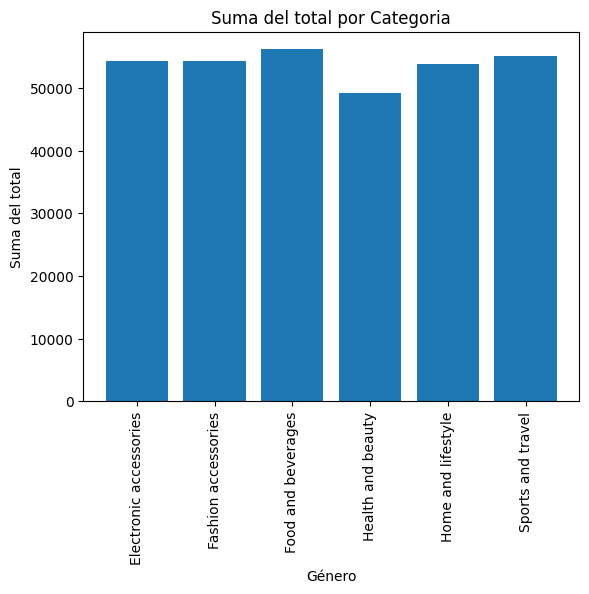

In [ ]:
plt.bar(df_pl.index, df_pl.values)
# Agregar etiquetas y título
plt.xlabel('Género')
plt.ylabel('Suma del total')
plt.title('Suma del total por Categoria')
plt.xticks(rotation=90)

# Mostrar la gráfica
plt.show()

In [ ]:
# Filtrar el DataFrame por Gender igual a Hombres
df_male = df[df['Gender'] == 'Male']
# Calcular la suma del valor de la columna 'Total' agrupado por la columna 'Product line'
productos_male = df_male.groupby('Product line')['Total'].sum()
productos_male

Product line
Electronic accessories    27235.5090
Fashion accessories       23868.4950
Food and beverages        22973.9265
Health and beauty         30632.7525
Home and lifestyle        23825.0355
Sports and travel         26548.1055
Name: Total, dtype: float64

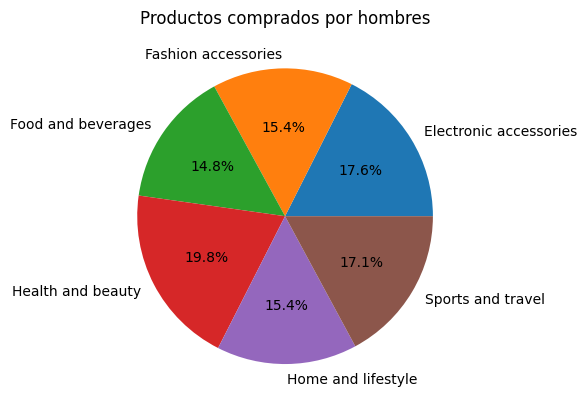

In [ ]:
plt.pie(productos_male, labels=df_pl.index, autopct='%1.1f%%')
plt.title('Productos comprados por hombres')
plt.show()

In [ ]:
# Filtrar el DataFrame por Gender igual a Mujer
df_female= df[df['Gender'] == 'Female']
# Calcular la suma del valor de la columna 'Total' agrupado por la columna 'Product line'
productos_fem = df_female.groupby('Product line')['Total'].sum()
productos_fem

Product line
Electronic accessories    27102.0225
Fashion accessories       30437.4000
Food and beverages        33170.9175
Health and beauty         18560.9865
Home and lifestyle        30036.8775
Sports and travel         28574.7210
Name: Total, dtype: float64

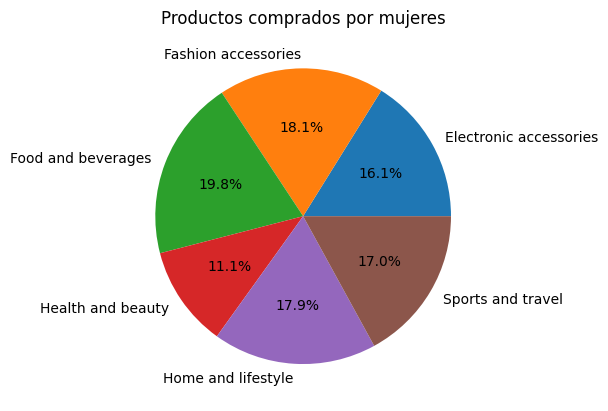

In [ ]:
plt.pie(productos_fem, labels=df_pl.index, autopct='%1.1f%%')
plt.title('Productos comprados por mujeres')
plt.show()

In [ ]:
# Agrupar las ventas por día
ventas_diarias = df.groupby(df['Date'].dt.date)['Total'].sum()

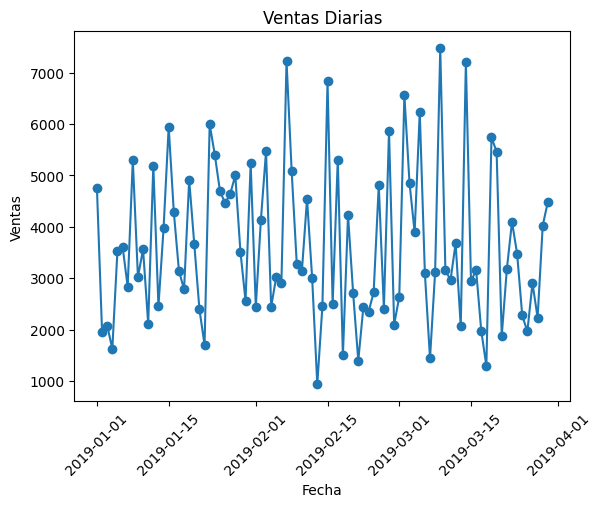

In [ ]:
# Crear la gráfica de líneas
plt.plot(ventas_diarias.index, ventas_diarias.values, marker='o', linestyle='-')

# Añadir etiquetas y título
plt.xlabel('Fecha')
plt.ylabel('Ventas')
plt.title('Ventas Diarias')

# Rotar las etiquetas del eje x para mejorar la legibilidad
plt.xticks(rotation=45)
plt.show()

# **Modelo De Predicción**

In [ ]:
# Definir una función para asignar letras de acuerdo a la calificación
def asignar_letra(calificacion):
    if calificacion >= 8:
        return 'A'
    elif calificacion >= 5:
        return 'B'
    else:
        return 'C'

# Aplicar la función a la columna 'rating' para crear la nueva columna 'letra'
df['letra'] = df['Rating'].apply(asignar_letra)

In [ ]:
df.head()

,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Date,Time,Payment,cogs,gross margin percentage,gross income,Rating,letra
0,750-67-8428,A,Yangon,Member,Female,Health and beauty,74.69,7,26.1415,548.9715,2019-01-05,13:08,Ewallet,522.83,4.761905,26.1415,9.1,A
1,226-31-3081,C,Naypyitaw,Normal,Female,Electronic accessories,15.28,5,3.8200,80.2200,2019-03-08,10:29,Cash,76.40,4.761905,3.8200,9.6,A
2,631-41-3108,A,Yangon,Normal,Male,Home and lifestyle,46.33,7,16.2155,340.5255,2019-03-03,13:23,Credit card,324.31,4.761905,16.2155,7.4,B
3,123-19-1176,A,Yangon,Member,Male,Health and beauty,58.22,8,23.2880,489.0480,2019-01-27,20:33,Ewallet,465.76,4.761905,23.2880,8.4,A
4,373-73-7910,A,Yangon,Normal,Male,Sports and travel,86.31,7,30.2085,634.3785,2019-02-08,10:37,Ewallet,604.17,4.761905,30.2085,5.3,B


In [ ]:
#importar pycaret
!pip install --pre pycaret

In [ ]:
import pycaret

In [ ]:
from pycaret.classification import *

In [ ]:
#Creación de Data Frame para modelo de predicción
# Crear Train
data_train = df.sample(frac = 0.8, random_state = 786)

In [ ]:
data_train.shape

(800, 18)

In [ ]:
# Crear Test
data_test = df.drop(data_train.index)

In [ ]:
data_test.shape

(200, 18)

In [ ]:
# Reescribir los indices Train
data_train.reset_index(drop = True, inplace = True)
data_train.head()

,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Date,Time,Payment,cogs,gross margin percentage,gross income,Rating,letra
0,716-39-1409,B,Mandalay,Normal,Male,Health and beauty,30.35,7,10.6225,223.0725,2019-03-19,18:19,Cash,212.45,4.761905,10.6225,8.0,A
1,719-76-3868,C,Naypyitaw,Member,Male,Food and beverages,94.26,4,18.8520,395.8920,2019-03-12,16:30,Cash,377.04,4.761905,18.8520,8.6,A
2,578-80-7669,B,Mandalay,Normal,Male,Sports and travel,74.97,1,3.7485,78.7185,2019-03-16,16:58,Cash,74.97,4.761905,3.7485,5.6,B
3,198-66-9832,B,Mandalay,Member,Female,Fashion accessories,72.04,2,7.2040,151.2840,2019-02-04,19:38,Cash,144.08,4.761905,7.2040,9.5,A
4,525-88-7307,B,Mandalay,Member,Male,Sports and travel,75.82,1,3.7910,79.6110,2019-01-31,13:19,Cash,75.82,4.761905,3.7910,5.8,B


In [ ]:
# Reescribir los indices de Test
data_test.reset_index(drop = True, inplace = True)
data_test.head()

,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Date,Time,Payment,cogs,gross margin percentage,gross income,Rating,letra
0,123-19-1176,A,Yangon,Member,Male,Health and beauty,58.22,8,23.2880,489.0480,2019-01-27,20:33,Ewallet,465.76,4.761905,23.2880,8.4,A
1,699-14-3026,C,Naypyitaw,Normal,Male,Electronic accessories,85.39,7,29.8865,627.6165,2019-03-25,18:30,Ewallet,597.73,4.761905,29.8865,4.1,C
2,315-22-5665,C,Naypyitaw,Normal,Female,Home and lifestyle,73.56,10,36.7800,772.3800,2019-02-24,11:38,Ewallet,735.60,4.761905,36.7800,8.0,A
3,252-56-2699,A,Yangon,Normal,Male,Food and beverages,43.19,10,21.5950,453.4950,2019-02-07,16:48,Ewallet,431.90,4.761905,21.5950,8.2,A
4,829-34-3910,A,Yangon,Normal,Female,Health and beauty,71.38,10,35.6900,749.4900,2019-03-29,19:21,Cash,713.80,4.761905,35.6900,5.7,B


In [ ]:
# Definimos el entorno de PyCaret con los datos de entrenamiento, esto hará que cada vez que
# llamemos a un modelo a entrenar se escojan dichos datos para entrenar.
reg = setup(data = data_train, target = 'letra', session_id = 123)

,Description,Value
0,Session id,123
1,Target,letra
2,Target type,Multiclass
3,Target mapping,"A: 0, B: 1, C: 2"
4,Original data shape,"(800, 18)"
5,Transformed data shape,"(800, 31)"
6,Transformed train set shape,"(560, 31)"
7,Transformed test set shape,"(240, 31)"
8,Numeric features,8
9,Date features,1


In [ ]:
best_model = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.9768,0.0000,0.9768,0.9778,0.9766,0.9610,0.9616,1.4510
gbc,Gradient Boosting Classifier,0.7696,0.0000,0.7696,0.6179,0.6787,0.5629,0.6259,0.5570
ridge,Ridge Classifier,0.7661,0.0000,0.7661,0.6531,0.7043,0.5754,0.6004,0.1870
rf,Random Forest Classifier,0.6964,0.0000,0.6964,0.7079,0.6337,0.4071,0.5014,0.3460
dt,Decision Tree Classifier,0.6696,0.0000,0.6696,0.4677,0.5443,0.3833,0.5258,0.2660
ada,Ada Boost Classifier,0.6196,0.0000,0.6196,0.4079,0.4841,0.2282,0.2629,0.2920
et,Extra Trees Classifier,0.5339,0.0000,0.5339,0.4723,0.3853,0.0353,0.1008,0.4980
nb,Naive Bayes,0.5196,0.0000,0.5196,0.2701,0.3554,0.0000,0.0000,0.2040
qda,Quadratic Discriminant Analysis,0.5196,0.0000,0.5196,0.2701,0.3554,0.0000,0.0000,0.2960
lda,Linear Discriminant Analysis,0.5196,0.0000,0.5196,0.2701,0.3554,0.0000,0.0000,0.3360


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

In [ ]:
lr = create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9821,0.0000,0.9821,0.9827,0.9820,0.9695,0.9701
1,1.0000,0.0000,1.0000,1.0000,1.0000,1.0000,1.0000
2,0.9821,0.0000,0.9821,0.9827,0.9818,0.9701,0.9706
3,0.9643,0.0000,0.9643,0.9652,0.9640,0.9405,0.9410
4,1.0000,0.0000,1.0000,1.0000,1.0000,1.0000,1.0000
5,0.9643,0.0000,0.9643,0.9666,0.9639,0.9395,0.9416
6,0.9821,0.0000,0.9821,0.9827,0.9817,0.9697,0.9703
7,0.9643,0.0000,0.9643,0.9652,0.9639,0.9398,0.9403
8,0.9643,0.0000,0.9643,0.9663,0.9646,0.9405,0.9410


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [ ]:
print(lr)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


In [ ]:
#Afinar Modelo
tune_lr = tune_model(lr)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9821,0.0000,0.9821,0.9827,0.9820,0.9695,0.9701
1,1.0000,0.0000,1.0000,1.0000,1.0000,1.0000,1.0000
2,0.9821,0.0000,0.9821,0.9839,0.9825,0.9707,0.9712
3,0.9643,0.0000,0.9643,0.9670,0.9644,0.9417,0.9433
4,1.0000,0.0000,1.0000,1.0000,1.0000,1.0000,1.0000
5,0.9643,0.0000,0.9643,0.9666,0.9639,0.9395,0.9416
6,1.0000,0.0000,1.0000,1.0000,1.0000,1.0000,1.0000
7,0.9464,0.0000,0.9464,0.9518,0.9464,0.9121,0.9156
8,0.9643,0.0000,0.9643,0.9663,0.9646,0.9405,0.9410


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


Revisión de Calidad del modelo

In [ ]:
#Revisión de QA
unseen_predictions = predict_model(tune_lr, data = data_test)
unseen_predictions.head()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Logistic Regression,0.4500,0.5117,0.4500,0.4360,0.3994,-0.0164,-0.0178


,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Date,Time,Payment,cogs,gross margin percentage,gross income,Rating,letra,prediction_label,prediction_score
0,123-19-1176,A,Yangon,Member,Male,Health and beauty,58.220001,8,23.288000,489.048004,2019-01-27,20:33,Ewallet,465.760010,4.761905,23.288000,8.4,A,B,0.7044
1,699-14-3026,C,Naypyitaw,Normal,Male,Electronic accessories,85.389999,7,29.886499,627.616516,2019-03-25,18:30,Ewallet,597.729980,4.761905,29.886499,4.1,C,B,0.8187
2,315-22-5665,C,Naypyitaw,Normal,Female,Home and lifestyle,73.559998,10,36.779999,772.380005,2019-02-24,11:38,Ewallet,735.599976,4.761905,36.779999,8.0,A,B,0.8826
3,252-56-2699,A,Yangon,Normal,Male,Food and beverages,43.189999,10,21.594999,453.494995,2019-02-07,16:48,Ewallet,431.899994,4.761905,21.594999,8.2,A,B,0.5664
4,829-34-3910,A,Yangon,Normal,Female,Health and beauty,71.379997,10,35.689999,749.489990,2019-03-29,19:21,Cash,713.799988,4.761905,35.689999,5.7,B,B,0.4641


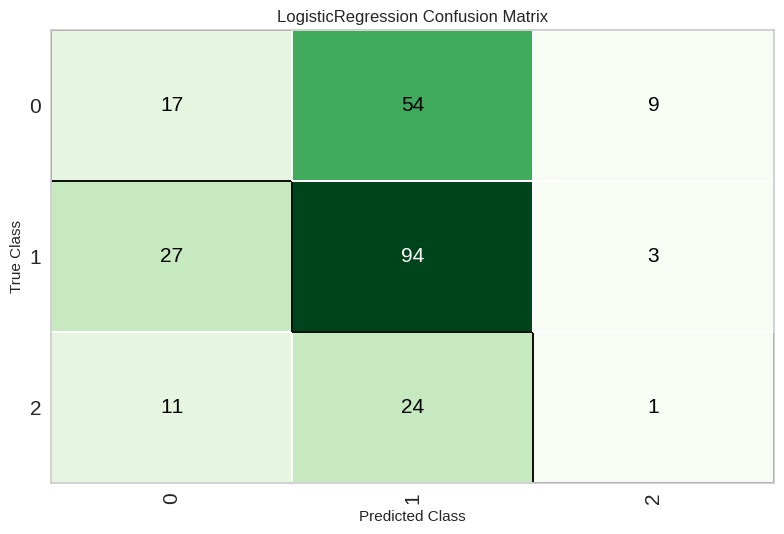

In [ ]:
plot_model(tune_lr, plot = 'confusion_matrix')

In [ ]:
evaluate_model(tune_lr)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…